In [ ]:
# #   leggo il csv
# Con il tuo DataFrame puoi fare:

# Raggruppamenti con groupby() per osservare metriche aggregate per Division, Settimana, ecc.
# Analisi temporali per osservare come le metriche cambiano nel tempo.
# Analisi delle correlazioni per scoprire relazioni tra metriche.
# Calcoli di metriche derivate (come percentuali, rapporti, conversion rate).
# Analisi con condizioni specifiche (filtraggio).
# Visualizzazioni per ottenere una panoramica chiara dei dati
# #   

# Calcolare e mostrare grafici di vendite togliendo i casi superflui, ossia
#   prendere il primo e secondo picco ed analizzarlo senza valori superflui
#   così da trovare effettivamente quanto impattano le singole colonne sulla colonna sales
#   tramite la differenza di proporzione
#   possiamo analizzare le Sales in base ai gruppi


# L'analisi di questo set di dati poteva finire con un solo grafico, quello di correlazione,
# data la mancanza di dati abbastanza importanti, come il costo e la quantità settimanale per gererare ogni engagment, ma per avvalorare e mostrare la mia tesi, ho creato molti altri grafici

# Purtroppo questo set di dati pecca nella spiegazione delle rispettive colonne
# Tipo di piattaforma
# Tipo di contenuto
# Tipo di pubblicità

# Data la mancanza di questi dati, si può completare l'analisi dicendo che ci sono delle correlazioni molto forti tra le vendite e [lista di impressions]
# e tra specifici gruppi [lista dei gruppi e proporzione sulle vendite date dal gruppo]

### Importo le librerie

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')
# Impostare Pandas per visualizzare l'output completo
pd.set_option('display.max_columns', None)  # Mostra tutte le colonne
pd.set_option('display.width', 1000)  # Imposta una larghezza complessiva maggiore
pd.set_option('display.max_rows', None)  # Mostra tutte le righe

Creo un dataframe leggendo il file csv

In [2]:
df = pd.read_csv('Sample Media Spend Data.csv')

df['Calendar_Week'] = pd.to_datetime(df['Calendar_Week'], errors='coerce')
df['Month'] = df['Calendar_Week'].dt.month_name()

df_columns = df.columns
# Ordinare il DataFrame in ordine crescente in base alla colonna 'data'
#df = df.sort_values(by='Calendar_Week').reset_index(drop=True)
# Converti tutte le colonne in numeri, se possibile
#df_converted = df.apply(pd.to_numeric, errors='coerce')
df1 = df.loc[:,df_columns[2:10]]
df.head()

,Division,Calendar_Week,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales,Month
0,A,2018-01-06,392,422,408,349895.0107,73580,12072,682,59417,January
1,A,2018-01-13,787,904,110,506270.2176,11804,9499,853,56806,January
2,A,2018-01-20,81,970,742,430042.1538,52232,17048,759,48715,January
3,A,2018-01-27,25,575,65,417745.6658,78640,10207,942,72047,January
4,A,2018-02-03,565,284,295,408505.8012,40561,5834,658,56235,February


### Creo una funzione che mi smista le colonne colonne numeriche da quelle categoriche

In [3]:
def get_num_cat_columns(df):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    num = df.select_dtypes(include=numerics).columns.to_list()
    cat = df.select_dtypes(include=['object', 'datetime']).columns.to_list()
    return num, cat

numeric_columns, categorical_columns  = get_num_cat_columns(df)
numeric_columns, categorical_columns

(['Paid_Views',
  'Organic_Views',
  'Google_Impressions',
  'Email_Impressions',
  'Facebook_Impressions',
  'Affiliate_Impressions',
  'Overall_Views',
  'Sales'],
 ['Division', 'Calendar_Week', 'Month'])

In [ ]:
#df['Calendar_Week'] = pd.to_datetime(df['Calendar_Week'])

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3051 entries, 0 to 3050
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Division               3051 non-null   object        
 1   Calendar_Week          3051 non-null   datetime64[ns]
 2   Paid_Views             3051 non-null   int64         
 3   Organic_Views          3051 non-null   int64         
 4   Google_Impressions     3051 non-null   int64         
 5   Email_Impressions      3051 non-null   float64       
 6   Facebook_Impressions   3051 non-null   int64         
 7   Affiliate_Impressions  3051 non-null   int64         
 8   Overall_Views          3051 non-null   int64         
 9   Sales                  3051 non-null   int64         
 10  Month                  3051 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(7), object(2)
memory usage: 262.3+ KB


In [5]:
df.isnull().sum()

Division                 0
Calendar_Week            0
Paid_Views               0
Organic_Views            0
Google_Impressions       0
Email_Impressions        0
Facebook_Impressions     0
Affiliate_Impressions    0
Overall_Views            0
Sales                    0
Month                    0
dtype: int64

In [6]:
# Restituisce il numero totale di righe duplicate
df.duplicated().sum()

# Se ci fossero stai dei duplicati sarebbero stati tolti con
#df = df.drop_duplicates(ignore_index=True)

0

In [7]:
df1.describe().round(2)
#df1.columns

,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
count,3051.00,3051.00,3051.00,3051.00,3051.00,3051.00,3051.00,3051.0
mean,15093.94,13355.67,886173.83,760509.38,269126.89,22910.90,27980.91,185901.4
std,30785.88,24079.40,1355075.82,626014.12,466511.67,21617.64,52054.98,232207.9
min,1.00,1.00,7.00,40894.45,29.00,910.00,2.00,15436.0
25%,537.00,712.50,169828.00,378496.92,57073.50,9127.00,747.00,73393.5
50%,2699.00,4110.00,490531.00,590970.80,127523.00,16658.00,7879.00,113573.0
75%,17358.00,16230.50,1022621.50,962246.61,283505.00,27486.50,34111.50,202975.5
max,518190.00,270453.00,17150439.00,7317730.25,7558435.00,175791.00,635057.00,3575430.0


In [8]:
df1.corr().round(2)

,Paid_Views,Organic_Views,Google_Impressions,Email_Impressions,Facebook_Impressions,Affiliate_Impressions,Overall_Views,Sales
Paid_Views,1.00,0.80,0.31,0.29,0.32,0.22,0.96,0.29
Organic_Views,0.80,1.00,0.43,0.34,0.41,0.23,0.93,0.39
Google_Impressions,0.31,0.43,1.00,0.64,0.73,0.35,0.38,0.78
Email_Impressions,0.29,0.34,0.64,1.00,0.52,0.70,0.33,0.75
Facebook_Impressions,0.32,0.41,0.73,0.52,1.00,0.29,0.38,0.75
Affiliate_Impressions,0.22,0.23,0.35,0.70,0.29,1.00,0.23,0.44
Overall_Views,0.96,0.93,0.38,0.33,0.38,0.23,1.00,0.35
Sales,0.29,0.39,0.78,0.75,0.75,0.44,0.35,1.00


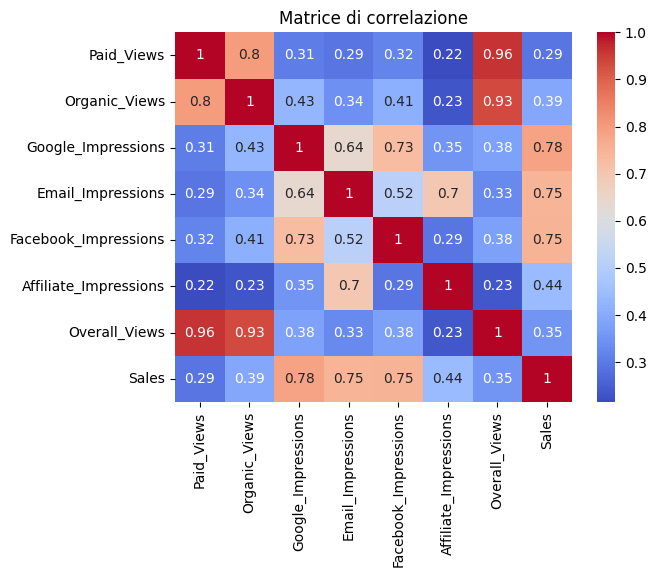

In [3]:
#plt.figure(figsize=(20,10))
#sns.heatmap(df1.corr(), annot=True, cmap='coolwarm', fmt=".2f", center=0)
sns.heatmap(df1.corr(), annot=True, cmap="coolwarm")
#sns.heatmap(df[df.columns[1:-1]].corr(), annot=True, cmap="coolwarm")
plt.title('Matrice di correlazione')
plt.show()

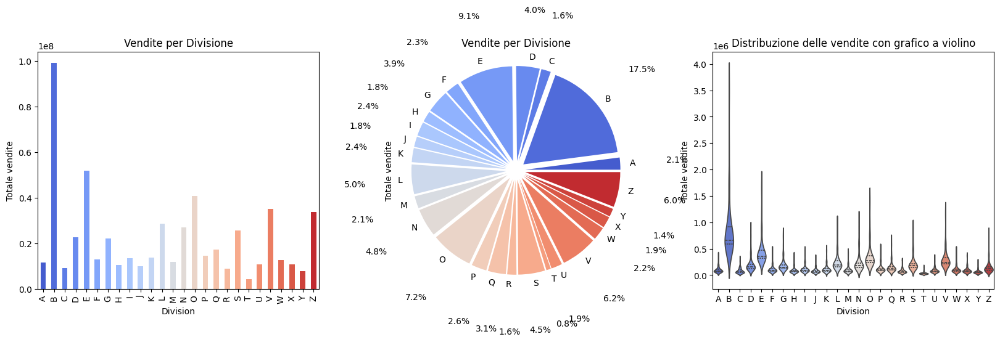

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns


# Definizione di una palette comune
palette = sns.color_palette("coolwarm", len(df['Division'].unique()))

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Grafico a barre
df.groupby('Division')['Sales'].sum().plot(kind='bar', ax=axes[0], color=palette)
axes[0].set_title('Vendite per Divisione')
axes[0].set_ylabel("Totale vendite")

# Grafico a torta
df_grouped = df.groupby('Division')['Sales'].sum()
axes[1].pie(df_grouped, labels=df_grouped.index, autopct='%1.1f%%', pctdistance=1.6, colors=palette, explode= [0.1] * len(df_grouped))
axes[1].set_title("Vendite per Divisione")
axes[1].set_ylabel("Totale vendite")

# Grafico a violino
sns.violinplot(x='Division', y='Sales', data=df, inner='quartile', palette=palette, ax=axes[2])
axes[2].set_title('Distribuzione delle vendite con grafico a violino')
axes[2].set_ylabel("Totale vendite")

plt.show()


In [63]:
df.columns[2:9]

Index(['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], dtype='object')

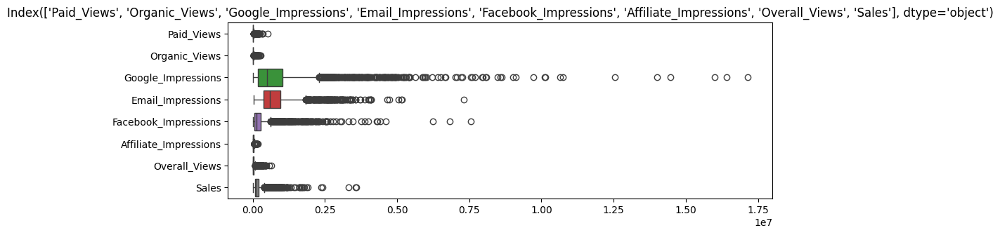

In [16]:
column_batches = [df.columns[2:10]]
#column_batches = [['Paid_Views', 'Organic_Views', 'Affiliate_Impressions','Overall_Views'],['Google_Impressions', 'Email_Impressions', 'Facebook_Impressions'],['Sales']]
plt.figure(figsize=(10,15))
for n,i in enumerate(column_batches):
    plt.subplot(4,1,n+1)
    sns.boxplot(df[i], orient="h")
    plt.title(i)

In [17]:
df.columns[2:10]

Index([], dtype='object')

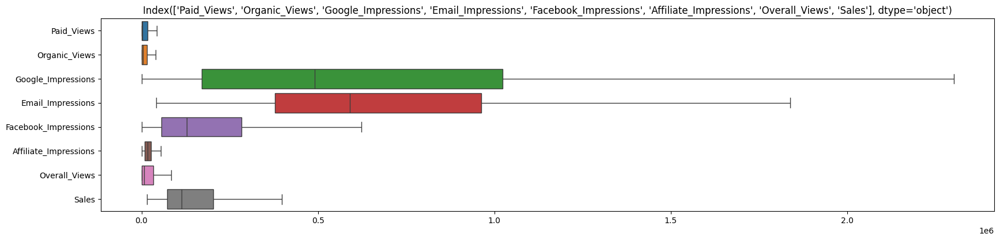

In [17]:
# def treat_outliers(df_in, col):
#     q1 = df_in[col].quantile(0.25)
#     q3 = df_in[col].quantile(0.75)
#     iqr = q3-q1
#     upper_bound = q3+1.5*iqr
#     df_in[col][df_in[col] >= upper_bound] = upper_bound
#     return df_in

def treat_outliers(df_in, col):
    # Copia il DataFrame per non sovrascrivere i dati originali
    df_out = df_in.copy()
    q1 = df_out[col].quantile(0.25)
    q3 = df_out[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    df_out.loc[df_out[col] < lower_bound, col] = lower_bound
    df_out.loc[df_out[col] > upper_bound, col] = upper_bound

    return df_out


fields_to_outlier_treatment = df.columns[2:10]

for col in fields_to_outlier_treatment:
    df = treat_outliers(df, col)

column_batches = [df.columns[2:10]]

plt.figure(figsize=(20,20))
for n,i in enumerate(column_batches):
    plt.subplot(4,1,n+1)
    sns.boxplot(df[i], orient="h")
    plt.title(i)


In [8]:
df.shape

(3051, 11)

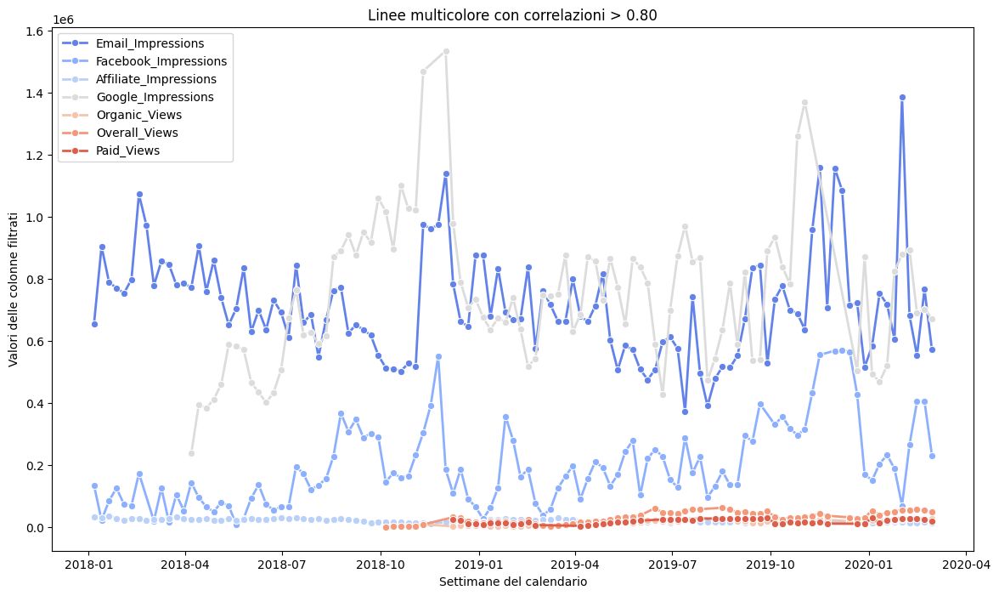

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

colonne = df.columns[2:9]  # Selezionare le colonne numeriche di interesse

# Creare una struttura con dati filtrati per la correlazione > 0.8
filtered_data = []

for week in df['Calendar_Week'].unique():
    weekly_df = df[df['Calendar_Week'] == week]
    
    # Calcola la correlazione per ciascun fattore con Sales
    weekly_corr = weekly_df[colonne].corrwith(weekly_df['Sales']).dropna()
    
    # Filtrare solo le colonne con correlazione maggiore di 0.80
    for col in weekly_corr.index:
        if abs(weekly_corr[col]) > 0.6:  # Considerare solo correlazioni assolute > 0.8
            filtered_data.append({
                "week": week,
                "column": col,
                "correlation": weekly_corr[col],
                "value": weekly_df[col].mean()  # Valore medio per ciascun fattore
            })

# Convertire la lista in un DataFrame
filtered_df = pd.DataFrame(filtered_data)

# Creare il grafico con la linea multicolore
plt.figure(figsize=(14, 8))

# Creare la linea multicolore con hue basato sulle colonne
sns.lineplot(
    data=filtered_df,
    x="week",
    y="value",
    hue="column",
    palette="coolwarm",
    marker="o",
    linewidth=2
)

plt.xlabel('Settimane del calendario')
plt.ylabel('Valori delle colonne filtrati')
plt.title('Linee multicolore con correlazioni > 0.80')
plt.legend()
plt.show()


In [11]:
import pandas as pd
import plotly.express as px
from matplotlib import colors as mcolors

colonne = df.columns[2:9]  # Selezionare le colonne numeriche di interesse

# Creare una struttura con dati filtrati per la correlazione > 0.8
filtered_data = []

for week in df['Calendar_Week'].unique():
    weekly_df = df[df['Calendar_Week'] == week]
    weekly_corr = weekly_df[colonne].corrwith(weekly_df['Sales']).dropna()
    
    for col in weekly_corr.index:
        if abs(weekly_corr[col]) > 0.65:  # Filtraggio correlazioni > 0.8
            filtered_data.append({
                "week": week,
                "column": col,
                "value": weekly_df[col].mean(),
                "correlation": weekly_corr[col]
            })

filtered_df = pd.DataFrame(filtered_data)

# Calcolare l'andamento settimanale delle vendite
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()

# Creare il grafico principale
fig = px.line(
    filtered_df,
    x="week",
    y="value",
    color="column",
    hover_data=["correlation"]
)

# Aggiungere la linea delle vendite al grafico
fig.add_scatter(
    x=weekly_sales["Calendar_Week"],
    y=weekly_sales["Sales"],
    mode="lines+markers",
    name="Vendite",
    line=dict(color="black", dash="dash"),
    hoverinfo="x+y",
    marker=dict(size=6)
)

# Ridurre la luminosità dei marker delle correlazioni
for trace in fig.data:
    if trace.mode == "lines":
        darkened_marker_color = mcolors.to_rgba(trace.line.color, 0.6)  # Scurire il marker
        trace.update(marker=dict(size=6, color=darkened_marker_color))

# Aggiornare layout
fig.update_layout(
    title="Correlazioni > 0.8 con Marker Scuri e Grafico Vendite",
    xaxis_title="Settimane del calendario",
    yaxis_title="Valori delle colonne filtrati",
)

fig.show()


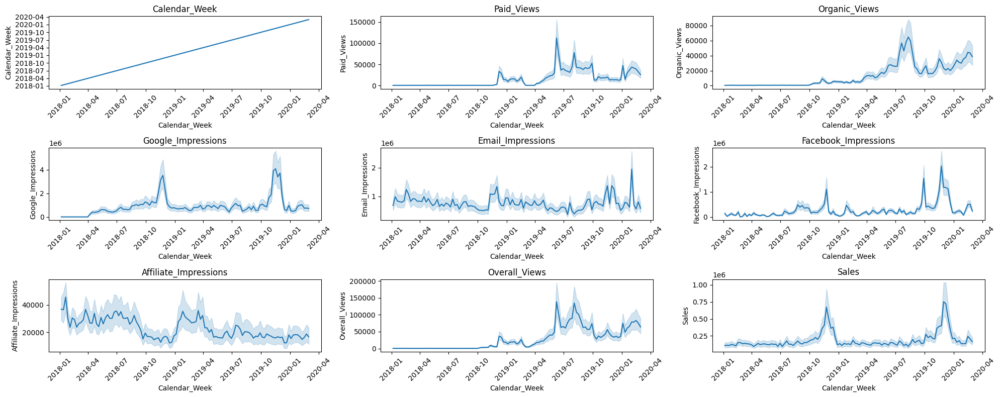

In [24]:
import numpy as np

# Creazione della griglia di grafici
fig, axes = plt.subplots(3, 3, figsize=(20, 8))  # Griglia 3x3 di grafici


# Lista delle metriche da visualizzare
colonne = df.columns[1:]

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
        axes[row, col].set_title(f'{colonne[idx]}')
        axes[row, col].tick_params(axis='x', rotation=45)
    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


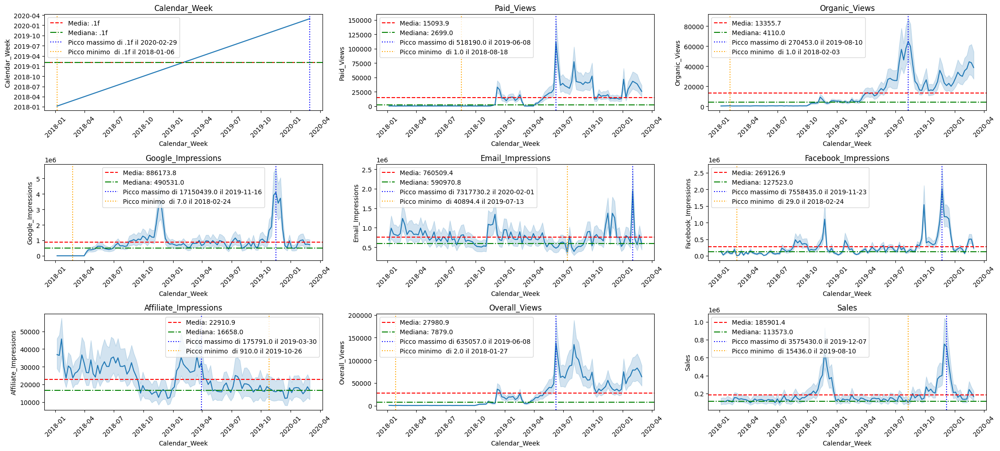

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(22, 10))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:10]

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare il minimo e massimo per il singolo grafico
            y_min = df[colonne[idx]].min()
            y_max = df[colonne[idx]].max()

            p_x_max = df.loc[df[colonne[idx]].idxmax(), 'Calendar_Week']
            p_x_min = df.loc[df[colonne[idx]].idxmin(), 'Calendar_Week']
            
            # Disegnare il grafico con la sua scala
            sns.lineplot(data=df, x='Calendar_Week', y=colonne[idx], ax=axes[row, col])
            axes[row, col].set_title(f'{colonne[idx]}')
            axes[row, col].tick_params(axis='x', rotation=45)

            # Aggiungere la media della y
            mean_yvalue = df[colonne[idx]].mean()
            axes[row, col].axhline(mean_yvalue, color='red', linestyle='--', label=f'Media: {mean_yvalue:.1f}')

            # Aggiungere la mediana della y
            median_yvalue = df[colonne[idx]].median()
            axes[row, col].axhline(median_yvalue, color='green', linestyle='-.', label=f'Mediana: {median_yvalue:.1f}')

            # Disegnare la linea del massimo picco con axhline
            #axes[row, col].axhline(y=y_max, color='blue', linestyle=':', label=f'Max: {y_max:.2f}')

            # Disegnare la linea del minimo picco con axhline
            #axes[row, col].axhline(y=y_min, color='orange', linestyle=':', label=f'Min: {y_min:.2f}')
            

            axes[row, col].axvline(x=p_x_max, color='blue', linestyle=':', label=f'Picco massimo di {y_max:.1f} il {str(p_x_max)[:10]}')
            # Aggiungere una axvline al minimo
            axes[row, col].axvline(x=p_x_min, color='orange', linestyle=':', label=f'Picco minimo  di {y_min:.1f} il {str(p_x_min)[:10]}')

            # Aggiungere una legenda
            axes[row, col].legend(fontsize=10)

        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondiamo l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


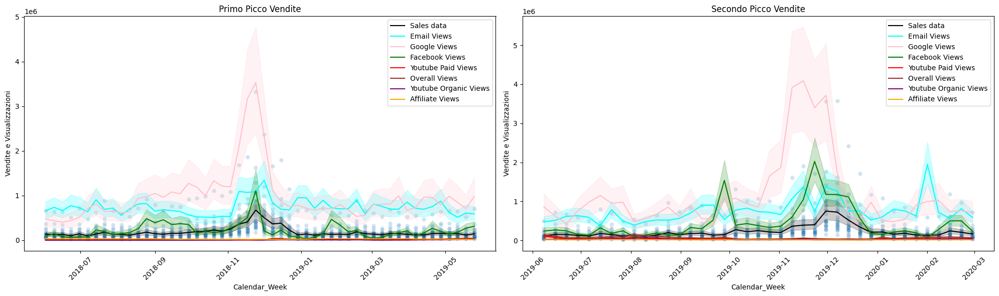

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creazione della figura con 2 sottoplot
fig, axes = plt.subplots(1, 2, figsize=(20, 6))

# Creazione dei sottoinsiemi dei dati
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle colonne da tracciare con i rispettivi colori
plot_info = [
    ('Sales', 'black', 'Sales data'),
    ('Email_Impressions', 'cyan', 'Email Views'),
    ('Google_Impressions', 'pink', 'Google Views'),
    ('Facebook_Impressions', 'green', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'brown', 'Overall Views'),
    ('Organic_Views', 'purple', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'orange', 'Affiliate Views')
]

# Grafico sul primo sottoplot
sns.scatterplot(data=df_primo_picco_vendite, y='Sales', x='Calendar_Week', ax=axes[0], alpha=0.2)
for y_col, color, label in plot_info:
    sns.lineplot(data=df_primo_picco_vendite, x='Calendar_Week', y=y_col, ax=axes[0], color=color, label=label)

axes[0].tick_params(axis='x', rotation=45)
axes[0].set_title('Primo Picco Vendite')
axes[0].set_ylabel('Vendite e Visualizzazioni')
axes[0].legend()

# Grafico sul secondo sottoplot
sns.scatterplot(data=df_secondo_picco_vendite, y='Sales', x='Calendar_Week', ax=axes[1], alpha=0.2)
for y_col, color, label in plot_info:
    sns.lineplot(data=df_secondo_picco_vendite, x='Calendar_Week', y=y_col, ax=axes[1], color=color, label=label)

axes[1].tick_params(axis='x', rotation=45)
axes[1].set_title('Secondo Picco Vendite')
axes[1].set_ylabel('Vendite e Visualizzazioni')
axes[1].legend()

# Mostrare il layout combinato
plt.tight_layout()
plt.show()


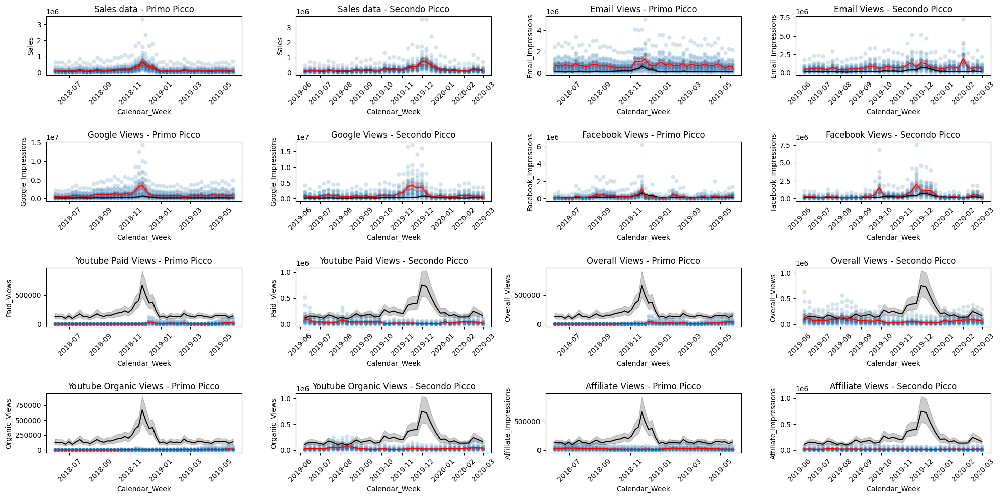

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt

# Separazione dei sottoinsiemi dei dati
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle colonne da tracciare con i rispettivi colori
plot_info = [
    ('Sales', 'red', 'Sales data'),
    ('Email_Impressions', 'red', 'Email Views'),
    ('Google_Impressions', 'red', 'Google Views'),
    ('Facebook_Impressions', 'red', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'red', 'Overall Views'),
    ('Organic_Views', 'red', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'red', 'Affiliate Views')
]

# Creazione della griglia 4x4
fig, axes = plt.subplots(4, 4, figsize=(20, 10))

# Ciclo per assegnare ciascun elemento della lista plot_info a una coppia di grafici nella rispettiva riga
for idx, (y_col, color, title) in enumerate(plot_info):
    # Determinare la posizione sulla griglia 4x4
    row = idx // 2  # Calcola la riga
    col_left = idx * 2 % 4  # Colonna sinistra
    col_right = col_left + 1  # Colonna destra

    # Scatter e lineplot per il primo sottoinsieme di dati
    sns.scatterplot(
        data=df_primo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_left],
        alpha=0.2
    )
    sns.lineplot(data = df_primo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[row, col_left], color = 'black')
    sns.lineplot(
        data=df_primo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_left],
        color=color
    )
    axes[row, col_left].tick_params(axis='x', rotation=45)
    axes[row, col_left].set_title(f'{title} - Primo Picco')

    # Scatter e lineplot per il secondo sottoinsieme di dati
    sns.scatterplot(
        data=df_secondo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_right],
        alpha=0.2
    )
    sns.lineplot(data = df_secondo_picco_vendite, x='Calendar_Week', y='Sales',ax=axes[row, col_right], color = 'black')
    sns.lineplot(
        data=df_secondo_picco_vendite,
        x='Calendar_Week',
        y=y_col,
        ax=axes[row, col_right],
        color=color
    )
    axes[row, col_right].tick_params(axis='x', rotation=45)
    axes[row, col_right].set_title(f'{title} - Secondo Picco')

# Ottimizzazione della visualizzazione
plt.tight_layout()
plt.show()


Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


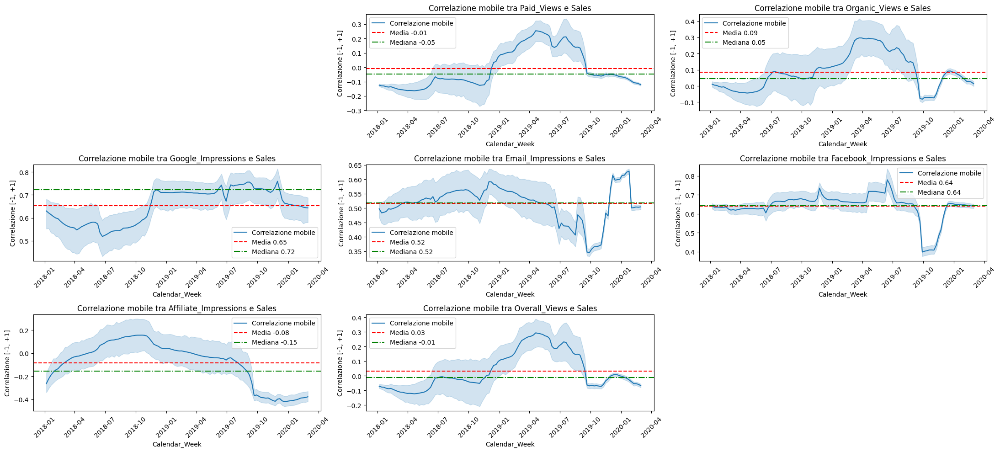

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica della griglia
fig, axes = plt.subplots(3, 3, figsize=(22, 10))  # Griglia 3x3 di grafici

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Ciclo per iterare sugli assi e disegnare il lineplot
for idx, (row, col) in enumerate(np.ndindex(axes.shape)):
    # Evitiamo di superare la lunghezza delle metriche disponibili
    if idx < len(colonne):
        try:
            # Calcolare la correlazione mobile con finestra di 30
            rolling_corr = df[colonne[idx]].rolling(window=90).corr(df['Sales'])#810

            # Calcolare statistiche mobili (media, mediana, massimo, minimo) su finestra rolling
            rolling_mean = rolling_corr.mean()
            rolling_median = rolling_corr.median()
            # rolling_max = rolling_corr.max()
            # rolling_min = rolling_corr.min()

            # Disegnare il grafico di correlazione mobile
            sns.lineplot(x=df['Calendar_Week'], y=rolling_corr, ax=axes[row, col], label='Correlazione mobile')

            # Disegnare le medie e statistiche con axhline
            axes[row, col].axhline(y=rolling_mean, color='red', linestyle='--', label=f'Media {rolling_mean:.2f}')
            axes[row, col].axhline(y=rolling_median, color='green', linestyle='-.', label=f'Mediana {rolling_median:.2f}')
            #axes[row, col].axhline(y=rolling_max, color='blue', linestyle=':', label=f'Massimo picco {rolling_max:.2f}')
            #axes[row, col].axhline(y=rolling_min, color='orange', linestyle=':', label=f'Minimo picco {rolling_min:.2f}')

            # p_x_max = df.loc[df[colonne[idx]].idxmax(), 'Calendar_Week']
            # p_x_min = df.loc[df[colonne[idx]].idxmin(), 'Calendar_Week']
                        # Aggiungere una axvline al massimo
            # axes[row, col].axvline(x=p_x_max, color='blue', linestyle=':', label=f'Picco max di {rolling_max:.1f} il {str(p_x_max)[:10]}')

            # # Aggiungere una axvline al minimo
            # axes[row, col].axvline(x=p_x_min, color='orange', linestyle=':', label=f'Picco min di {rolling_min:.1f} il {str(p_x_min)[:10]}')
            
            # Impostare il titolo e le etichette degli assi
            axes[row, col].set_title(f'Correlazione mobile tra {colonne[idx]} e Sales')
            axes[row, col].set_ylabel('Correlazione [-1, +1]')
            axes[row, col].tick_params(axis='x', rotation=45)

            # Impostare la legenda
            axes[row, col].legend(fontsize=10)

        except Exception as e:
            # Se c'è un errore nel calcolo o nella visualizzazione, stampare l'errore
            axes[row, col].axis('off')
            print(f"Errore con la metrica '{colonne[idx]}': {e}")

    else:
        # Se ci sono spazi vuoti nella griglia, nascondere l'asse
        axes[row, col].axis('off')

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


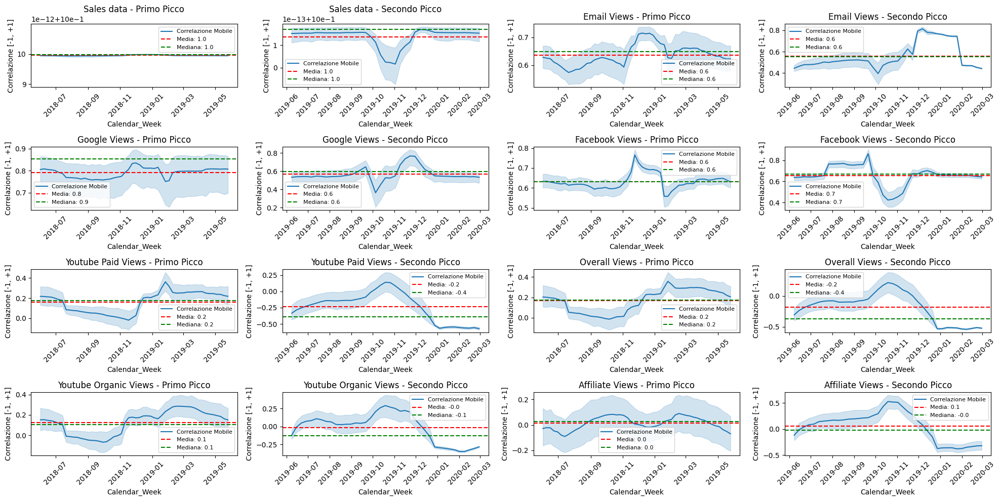

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Separazione dei sottoinsiemi dei dati
df_primo_picco_vendite = df.loc[(df['Calendar_Week'] > '2018-06-01') & (df['Calendar_Week'] < '2019-06-01')]
df_secondo_picco_vendite = df.loc[(df['Calendar_Week'] > '2019-06-01') & (df['Calendar_Week'] < '2020-06-01')]

# Lista delle metriche da tracciare con relativi titoli
plot_info = [
    ('Sales', 'red', 'Sales data'),
    ('Email_Impressions', 'red', 'Email Views'),
    ('Google_Impressions', 'red', 'Google Views'),
    ('Facebook_Impressions', 'red', 'Facebook Views'),
    ('Paid_Views', 'red', 'Youtube Paid Views'),
    ('Overall_Views', 'red', 'Overall Views'),
    ('Organic_Views', 'red', 'Youtube Organic Views'),
    ('Affiliate_Impressions', 'red', 'Affiliate Views')
]

# Creazione della griglia 4x4
fig, axes = plt.subplots(4, 4, figsize=(20, 10))

# Ciclo per calcolare e tracciare la correlazione mobile con finestra 10 per ciascun sottoinsieme
for idx, (y_col, color, title) in enumerate(plot_info):
    # Determinare la posizione sulla griglia 4x4
    row = idx // 2  # Calcola la riga
    col_left = idx * 2 % 4  # Colonna sinistra
    col_right = col_left + 1  # Colonna destra

    try:
        # Calcolare la correlazione mobile con finestra 10 e gestire NaN con fillna
        rolling_corr_primo = df_primo_picco_vendite[y_col].rolling(window=60).corr(df_primo_picco_vendite['Sales'])#.fillna(0)
        rolling_corr_secondo = df_secondo_picco_vendite[y_col].rolling(window=30).corr(df_secondo_picco_vendite['Sales'])#.fillna(0)

        # # Calcolo dei massimi e minimi per il primo picco
        # rolling_corr_primo_max = rolling_corr_primo.max()
        # rolling_corr_primo_min = rolling_corr_primo.min()

        # # Calcolo dei massimi e minimi per il secondo picco
        # rolling_corr_secondo_max = rolling_corr_secondo.max()
        # rolling_corr_secondo_min = rolling_corr_secondo.min()

        # # Calcoliamo i picchi con la loro corrispondenza in Calendar_Week
        # p1_x_max = df_primo_picco_vendite.loc[rolling_corr_primo.idxmax(), 'Calendar_Week']
        # p1_x_min = df_primo_picco_vendite.loc[rolling_corr_primo.idxmin(), 'Calendar_Week']

        # p2_x_max = df_secondo_picco_vendite.loc[rolling_corr_secondo.idxmax(), 'Calendar_Week']
        # p2_x_min = df_secondo_picco_vendite.loc[rolling_corr_secondo.idxmin(), 'Calendar_Week']

        # Tracciare la correlazione mobile per il primo picco
        sns.lineplot(
            x=df_primo_picco_vendite['Calendar_Week'],
            y=rolling_corr_primo,
            ax=axes[row, col_left],
            label='Correlazione Mobile'
        )
        axes[row, col_left].axhline(y=rolling_corr_primo.mean(), color='red', linestyle='--', label=f'Media: {rolling_corr_primo.mean():.1f}')
        axes[row, col_left].axhline(y=rolling_corr_primo.median(), color='green', linestyle='--', label=f'Mediana: {rolling_corr_primo.median():.1f}')
        axes[row, col_left].set_title(f'{title} - Primo Picco')
        # axes[row, col_left].axvline(x=p1_x_max, color='blue', linestyle=':', label=f'Picco max {rolling_corr_primo_max:.2f} il {str(p1_x_max)[:10]}')
        # axes[row, col_left].axvline(x=p1_x_min, color='orange', linestyle=':', label=f'Picco min {rolling_corr_primo_min:.2f} il {str(p1_x_min)[:10]}')
        axes[row, col_left].tick_params(axis='x', rotation=45)
        axes[row, col_left].set_ylabel('Correlazione [-1, +1]')
        axes[row, col_left].legend(fontsize=8)

        # Tracciare la correlazione mobile per il secondo picco
        sns.lineplot(
            x=df_secondo_picco_vendite['Calendar_Week'],
            y=rolling_corr_secondo,
            ax=axes[row, col_right],
            label='Correlazione Mobile'
        )
        axes[row, col_right].axhline(y=rolling_corr_secondo.mean(), color='red', linestyle='--', label=f'Media: {rolling_corr_secondo.mean():.1f}')
        axes[row, col_right].axhline(y=rolling_corr_secondo.median(), color='green', linestyle='--', label=f'Mediana: {rolling_corr_secondo.median():.1f}')
        axes[row, col_right].set_title(f'{title} - Secondo Picco')
        # axes[row, col_right].axvline(x=p2_x_max, color='blue', linestyle=':', label=f'Picco max {rolling_corr_secondo_max:.2f} il {str(p2_x_max)[:10]}')
        # axes[row, col_right].axvline(x=p2_x_min, color='orange', linestyle=':', label=f'Picco min {rolling_corr_secondo_min:.2f} il {str(p2_x_min)[:10]}')
        axes[row, col_right].tick_params(axis='x', rotation=45)
        axes[row, col_right].set_ylabel('Correlazione [-1, +1]')
        axes[row, col_right].legend(fontsize=8)

    except Exception as e:
        # Se c'è un errore nel calcolo o nella visualizzazione, disattivare l'asse
        axes[row, col_left].axis('off')
        axes[row, col_right].axis('off')
        print(f"Errore con la metrica '{y_col}': {e}")

# Ottimizzare la visualizzazione
plt.tight_layout()
plt.show()


In [26]:
df.columns[1:9]

Index(['Calendar_Week', 'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], dtype='object')

Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


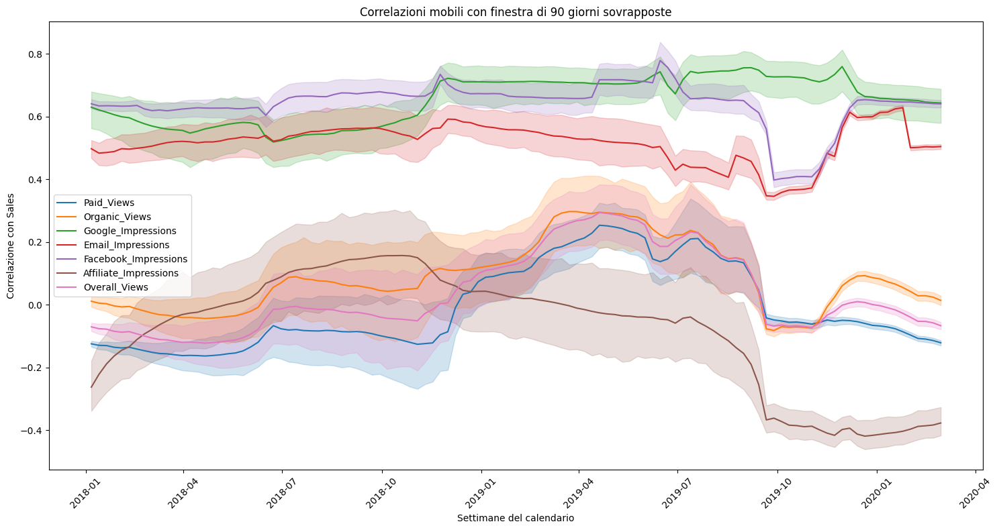

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione del grafico unico
plt.figure(figsize=(15, 8))

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Ciclo per disegnare ciascun lineplot in un unico grafico
for col in colonne:
    try:
        # Calcolare la correlazione mobile con finestra di 30
        rolling_corr = df[col].rolling(window=90).corr(df['Sales'])
        
        # Disegnare la correlazione mobile per ciascuna metrica
        sns.lineplot(x=df['Calendar_Week'], y=rolling_corr, label=col)
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Ottimizzare il grafico
plt.xlabel('Settimane del calendario')
plt.ylabel('Correlazione con Sales')
plt.title('Correlazioni mobili con finestra di 90 giorni sovrapposte')
plt.xticks(rotation=45)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()


Errore con la metrica 'Calendar_Week': Addition/subtraction of integers and integer-arrays with DatetimeArray is no longer supported.  Instead of adding/subtracting `n`, use `n * obj.freq`


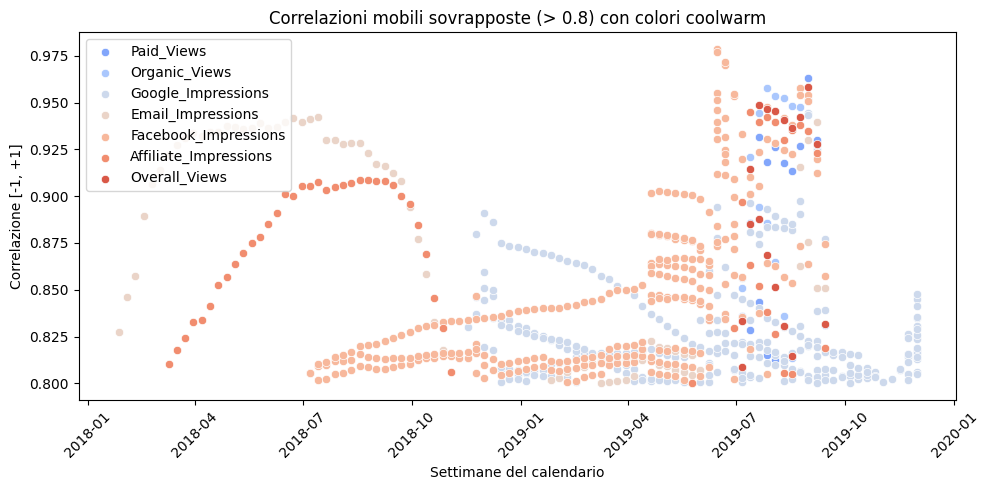

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Creazione dinamica del grafico unico
fig, ax = plt.subplots(figsize=(10, 5))  # Un'unica finestra

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Creazione di una scala di colori con "coolwarm"
colors = sns.color_palette("coolwarm", len(colonne))

# Ciclo per sovrapporre ciascun grafico con la sua correlazione mobile
for idx, col in enumerate(colonne):
    try:
        # Calcolare la correlazione mobile con finestra di 30
        rolling_corr = df[col].rolling(window=90).corr(df['Sales'])
        
        # Applicare la maschera per considerare solo valori > 0.8
        mask = rolling_corr > 0.8
        
        # Disegnare il grafico sovrapposto solo con la porzione > 0.8
        sns.scatterplot(x=df['Calendar_Week'][mask], y=rolling_corr[mask], ax=ax, label=col, color=colors[idx])
    except Exception as e:
        # Stampare l'errore se qualcosa va storto
        print(f"Errore con la metrica '{col}': {e}")

# Impostazioni titoli e leggibilità
ax.set_title('Correlazioni mobili sovrapposte (> 0.8) con colori coolwarm')
ax.set_xlabel('Settimane del calendario')
ax.set_ylabel('Correlazione [-1, +1]')
ax.tick_params(axis='x', rotation=45)  # Rotazione degli assi x per miglior leggibilità

# Leggibilità migliorata con la leggenda
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()


In [39]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []

window_size = 90  # Impostiamo la finestra mobile dinamica (puoi cambiarla facilmente)

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Evitare calcoli con NaN derivanti dalla finestra mobile e mascherare solo i valori > 0.8
        corr = 0.65
        mask = (rolling_corr > corr) #& (~rolling_corr.isna())

        # Estratto solo dove la finestra è pienamente calcolata
        valid_indices = rolling_corr.index[mask]

        # Correlazioni valide e settimane corrispondenti
        valid_corr = rolling_corr.loc[valid_indices]
        valid_weeks = df.loc[valid_indices, 'Calendar_Week']

        # Solo se esistono valori validi
        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "week": valid_weeks,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "week": [],
    "rolling_corr": [],
    "column": []
})

# Combina correttamente ogni serie dei dati calcolati
for data in rolling_data:
    temp_df = pd.DataFrame({
        "week": data["week"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales"}, inplace=True)

# Creazione del grafico combinato
fig = go.Figure()

# Scatter plot per le correlazioni mobili
for col in filtered_df['column'].unique():
    col_df = filtered_df[filtered_df['column'] == col]
    fig.add_trace(go.Scatter(
        x=col_df['week'],
        y=col_df['rolling_corr'],
        mode='markers',
        name=col
    ))

# Linea delle vendite settimanali su scala separata con colore nero
fig.add_trace(go.Scatter(
    x=weekly_sales["Calendar_Week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    yaxis="y2",
    line=dict(color="grey")  # Impostato il colore a nero
))

# Aggiornamento layout con una seconda scala Y
fig.update_layout(
    title=f"Correlazioni mobili > {corr} con finestra mobile di {window_size} giorni e vendite settimanali",
    xaxis_title="Settimane del calendario",
    yaxis=dict(
        title="Correlazione con Sales",
        side="left"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    showlegend=True
)

# Mostrare il grafico
fig.show()


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


In [40]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []
window_size = 90  # Impostiamo la finestra mobile dinamica
corr_threshold = 0.65  # Impostazione della soglia minima di correlazione

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Mascherare solo i valori di correlazione > corr_threshold
        mask = rolling_corr > corr_threshold
        valid_corr = rolling_corr[mask]
        valid_weeks = df.loc[mask, 'Calendar_Week']

        # Calcolare correlazioni settimanali
        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "week": valid_weeks,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "week": [],
    "rolling_corr": [],
    "column": []
})

for data in rolling_data:
    temp_df = pd.DataFrame({
        "week": data["week"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolo del conteggio settimanale di ciascuna metrica distinta
weekly_count_corr = filtered_df.groupby(['week', 'column']).size().reset_index(name="count_corr")

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales", "Calendar_Week": "week"}, inplace=True)

# Creazione grafico con Plotly
fig = go.Figure()

# Grafici a barre settimanali distinti per ciascun impression/colonna con dettagli nel tooltip
for col in weekly_count_corr['column'].unique():
    col_df = weekly_count_corr[weekly_count_corr['column'] == col]
    
    # Aggiunta delle informazioni al tooltip con dettagli
    fig.add_trace(go.Bar(
        x=col_df['week'],
        y=col_df['count_corr'],
        name=col,
        marker=dict(opacity=0.7),
        text=[
            f"Impression: {col}<br>"
            f"Settimana: {week.strftime('%Y-%U')}<br>"
            f"Conteggio correlazioni: {count}"
            for week, count in zip(col_df['week'], col_df['count_corr'])
        ],
        textposition='auto',
        hoverinfo="text"
    ))

# Sovrapposizione delle vendite settimanali con scala separata
fig.add_trace(go.Scatter(
    x=weekly_sales["week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    line=dict(color="black", width=2),
    yaxis="y2"
))

# Aggiornamento layout con due scale Y
fig.update_layout(
    title=f"Conteggio delle correlazioni > di {corr_threshold} settimanali per ciascun impressions con finestra mobile di {window_size} giorni e con vendite settimanali sovrapposte",
    xaxis_title="Settimane del calendario",
    yaxis=dict(
        title=f"Conteggio delle correlazioni superiori a {corr_threshold}"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    barmode="group",
    showlegend=True
)

# Mostrare il grafico
fig.show()


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


In [43]:
import pandas as pd
import plotly.graph_objects as go
import numpy as np

# Lista delle metriche da visualizzare
colonne = df.columns[1:9]  # Selezione delle colonne da analizzare

# Calcolo dinamico delle correlazioni mobili
rolling_data = []
window_size = 90  # Impostiamo la finestra mobile dinamica
corr_threshold = 0.65  # Impostazione della soglia minima di correlazione

for col in colonne:
    try:
        # Calcolare la correlazione mobile su finestra di window_size
        rolling_corr = df['Sales'].rolling(window=window_size).corr(df[col])

        # Mascherare solo i valori di correlazione > corr_threshold
        mask = rolling_corr > corr_threshold
        valid_corr = rolling_corr[mask]
        valid_weeks = df.loc[mask, 'Calendar_Week']

        # Convertire la settimana in una scala mensile per aggregare
        valid_months = valid_weeks.dt.to_period('M').dt.to_timestamp()

        if not valid_corr.empty:
            rolling_data.append({
                "column": col,
                "month": valid_months,
                "rolling_corr": valid_corr
            })
    except Exception as e:
        print(f"Errore con la metrica '{col}': {e}")

# Creare un DataFrame per visualizzare i risultati con Plotly
filtered_df = pd.DataFrame({
    "month": [],
    "rolling_corr": [],
    "column": []
})

for data in rolling_data:
    temp_df = pd.DataFrame({
        "month": data["month"],
        "rolling_corr": data["rolling_corr"],
        "column": [data["column"]] * len(data["rolling_corr"])
    })
    filtered_df = pd.concat([filtered_df, temp_df], ignore_index=True)

# Calcolo del conteggio mensile di ciascuna metrica distinta
monthly_count_corr = filtered_df.groupby(['month', 'column']).size().reset_index(name="count_corr")

# Calcolare l'andamento settimanale delle vendite medie
weekly_sales = df.groupby('Calendar_Week')['Sales'].mean().reset_index()
weekly_sales.rename(columns={"Sales": "weekly_mean_sales", "Calendar_Week": "week"}, inplace=True)

# Creazione grafico con Plotly
fig = go.Figure()

# Grafici a barre mensili distinti per ciascun impression/colonna
for col in monthly_count_corr['column'].unique():
    col_df = monthly_count_corr[monthly_count_corr['column'] == col]
    
    # Aggiunta delle informazioni al tooltip
    fig.add_trace(go.Bar(
        x=col_df['month'],
        y=col_df['count_corr'],
        name=col,
        marker=dict(opacity=0.7),
        text=[f"Impression: {col}<br>Mese: {month}<br>Conteggio correlazioni: {count}" 
              for month, count in zip(col_df['month'], col_df['count_corr'])],
        hoverinfo="text"
    ))

# Sovrapposizione delle vendite settimanali con scala separata
fig.add_trace(go.Scatter(
    x=weekly_sales["week"],
    y=weekly_sales["weekly_mean_sales"],
    mode='lines+markers',
    name="Vendite settimanali",
    line=dict(color="black", width=2),
    yaxis="y2"
))

# Aggiornamento layout con due scale Y
fig.update_layout(
    title=f"Conteggio delle correlazioni > di {corr_threshold} mensili per ciascun impressions con finestra mobile di {window_size} giorni e con vendite settimanali sovrapposte",
    xaxis_title="Mesi",
    yaxis=dict(
        title=f"Conteggio delle correlazioni superiori a {corr_threshold}"
    ),
    yaxis2=dict(
        title="Vendite settimanali",
        overlaying="y",
        side="right"
    ),
    barmode="group",
    showlegend=True
)

# Mostrare 


Errore con la metrica 'Calendar_Week': cannot perform __rmul__ with this index type: DatetimeArray


In [104]:
df_columns[2:]

Index(['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views', 'Sales'], dtype='object')

# Analisi grafici basati sul tempo
Come si può notare dai grafici, prendendo come riferimento l'ultimo in basso a destra, ovvero quello che mostra le vendite di settimana in settimana


In [28]:
#df['Month'] = df['Calendar_Week'].dt.month_name()
df.columns[2:9]


Index(['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], dtype='object')

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (12,) and arg 1 with shape (3744,).

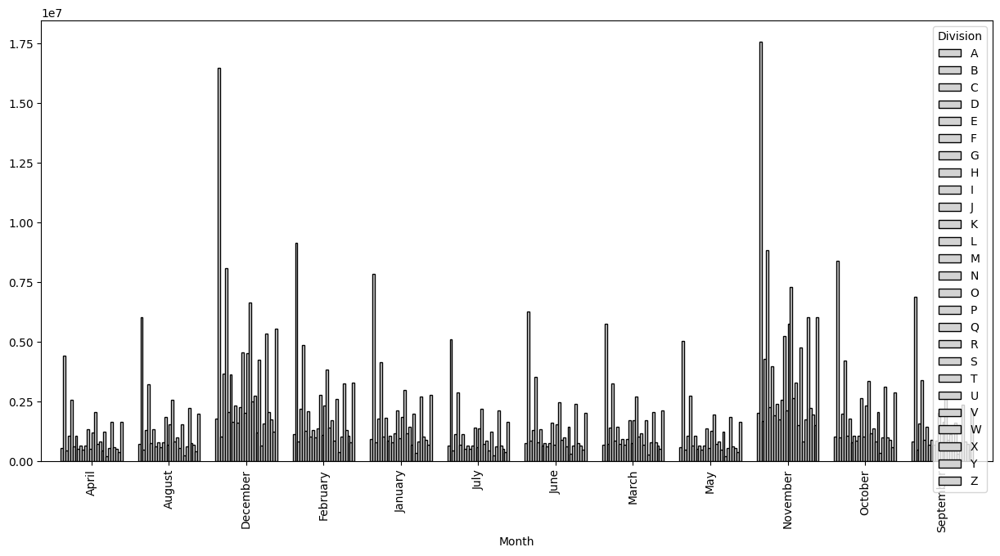

In [88]:
import matplotlib.pyplot as plt

# Calcolare il totale delle impressioni per ogni mese e divisione
df['Total_Impressions'] = df[['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 
                               'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views']].sum(axis=1)

# Creiamo una tabella pivot per ottenere la somma delle vendite per mese e divisione
pivot_sales = df.pivot_table(values='Sales', index='Month', columns='Division', aggfunc='sum')

# Creiamo una tabella pivot per ottenere la somma delle impressions per ogni mese e divisione
pivot_impressions = df.pivot_table(values=['Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 
                                          'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'], 
                                   index='Month', columns='Division', aggfunc='sum')

# Calcoliamo la percentuale di ogni tipo di impressione rispetto al totale delle impressioni per mese
pivot_impressions_percent = pivot_impressions.div(pivot_impressions.sum(axis=1), axis=0) * 100

# Crea una figura per il grafico
fig, ax = plt.subplots(figsize=(15, 7))

# Creiamo un colore per ogni tipo di impressione
impression_types = pivot_impressions.columns.levels[0].tolist()
colors = plt.cm.get_cmap('tab20', len(impression_types))  # Usare la mappa di colori 'tab20'

# Plot delle vendite (barra principale)
pivot_sales.plot(kind='bar', stacked=False, ax=ax, color='lightgrey', edgecolor='black', width=0.8)

# Aggiungere i "mattoncini" (impressions) alla barra principale
bottoms = pivot_sales.values  # Iniziamo con la base che è la barra delle vendite

# Per ogni tipo di impressione, calcoliamo la percentuale rispetto alla totalità delle impressions
for i, impression in enumerate(impression_types):
    # Estrai i dati di percentuale di impressione per il tipo corrente
    impression_data_percent = pivot_impressions_percent[impression].values
    
    # Per ogni mese e divisione, moltiplichiamo la percentuale per le vendite
    impression_data = impression_data_percent[:, None] * pivot_sales.values / 100
    
    # Aggiungiamo una barra per ciascun tipo di impressione (mattoncini)
    ax.bar(pivot_impressions_percent.index, impression_data.flatten(), bottom=bottoms.flatten(), 
           color=colors(i), width=0.8, label=impression)
    
    # Aggiorniamo la base per il prossimo "mattoncino"
    bottoms += impression_data.flatten().reshape(-1, 1)  # Modificato per l'aggiornamento corretto

# Migliorare la leggibilità
ax.set_title('Distribuzione delle vendite per Divisione (%) e Impressions nel tempo')
ax.set_ylabel('Percentuale (%)')
ax.set_xlabel('Mesi')

# Aggiungere la legenda
ax.legend(title='Tipo di Impressione', bbox_to_anchor=(1.05, 1), loc='upper left')

# Ottimizzare lo spazio tra gli elementi
plt.tight_layout()

# Mostrare il grafico
plt.show()


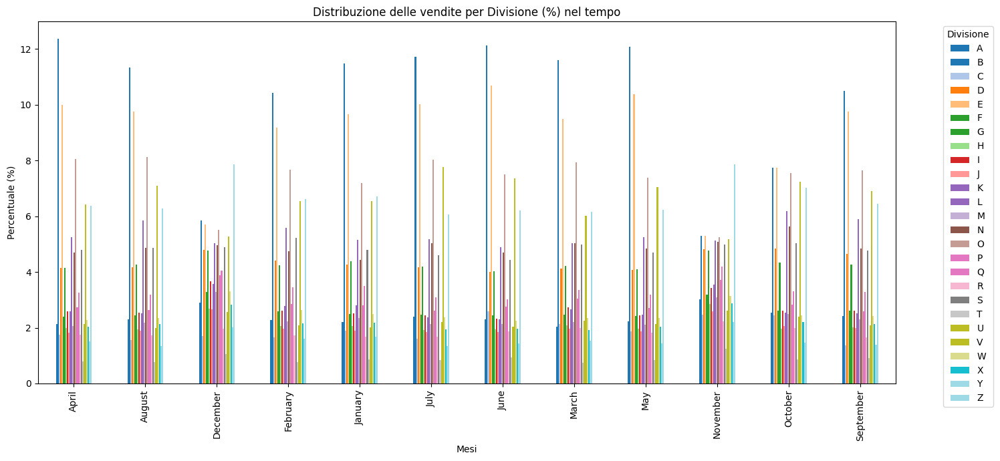

In [23]:
import matplotlib.pyplot as plt

# Creazione della tabella pivot per calcolare le percentuali
pivot_percentage = df.pivot_table(values='Sales', index='Month', columns='Division', aggfunc='sum')
pivot_percentage = pivot_percentage.div(pivot_percentage.sum(axis=1), axis=0) * 100

# Impostare una figura più chiara e con legenda ben posizionata
fig, ax = plt.subplots(figsize=(15, 7))

# Creare il grafico a barre con le percentuali
pivot_percentage.plot(kind='bar', stacked=False, ax=ax, colormap='tab20')

# Migliorare la leggibilità
ax.set_title('Distribuzione delle vendite per Divisione (%) nel tempo')
ax.set_ylabel('Percentuale (%)')
ax.set_xlabel('Mesi')
ax.legend(title='Divisione', bbox_to_anchor=(1.05, 1), loc='upper left')  # Posizionare la legenda fuori dal grafico

plt.tight_layout()  # Ottimizzare lo spazio tra elementi
plt.show()


  Division Calendar_Week  Paid_Views  Organic_Views  Google_Impressions  Email_Impressions  Facebook_Impressions  Affiliate_Impressions  Overall_Views  Sales     Month
0        A    2018-01-06         392            422                 408        349895.0107                 73580                  12072            682  59417   January
1        A    2018-01-13         787            904                 110        506270.2176                 11804                   9499            853  56806   January
2        A    2018-01-20          81            970                 742        430042.1538                 52232                  17048            759  48715   January
3        A    2018-01-27          25            575                  65        417745.6658                 78640                  10207            942  72047   January
4        A    2018-02-03         565            284                 295        408505.8012                 40561                   5834            658  56235  F

<Axes: xlabel='Month'>

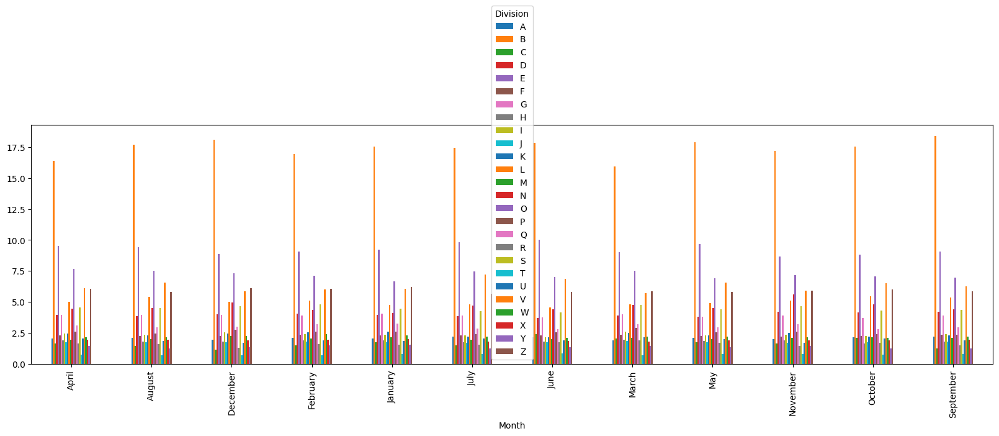

In [71]:
#fig, axes = plt.subplots(1, 2, figsize=(15, 5))
print(df.head())
#df['Month'] = df['Calendar_Week'].dt.month_name()
#df3 = df.groupby('Division', 'Calendar_Week')['Sales'].sum().unstuck()#.plot(kind='bar', ax=axes[0])
#df3.head()
#df.groupby('Division')['Sales'].sum().plot(kind='pie', ax=axes[1])
#pivot_table = df.pivot_table(values='Sales', index='Calendar_Week', columns='Division', aggfunc='sum')
#print(pivot_table)
pivot_table = df.pivot_table(values='Sales', index='Month', columns='Division', aggfunc='sum')

# Calcolare le percentuali
pivot_percentage = pivot_table.div(pivot_table.sum(axis=1), axis=0) * 100

print(pivot_percentage)

pivot_percentage.plot(kind='bar', figsize=(20,5))


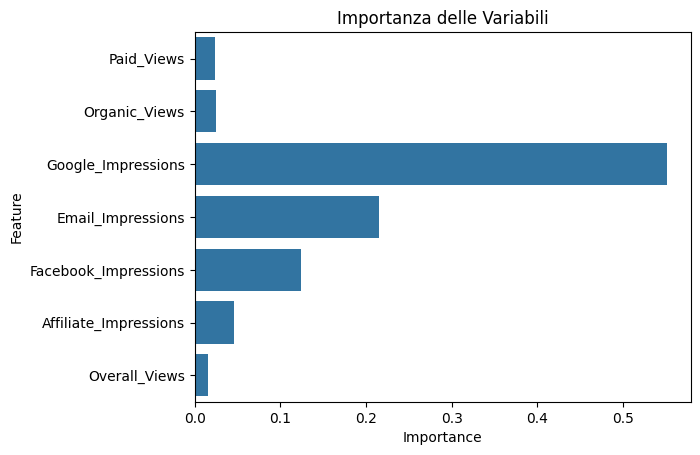

In [24]:
from sklearn.ensemble import RandomForestRegressor
#'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'
X = df[df.columns[2:9]].dropna()
y = df['Sales'].dropna()

model = RandomForestRegressor()
model.fit(X, y)

feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': model.feature_importances_})
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Importanza delle Variabili')
plt.show()


In [71]:
from ydata_profiling import ProfileReport

# Crea il report con YData Profiling
profile = ProfileReport(df, title="Profilo dei Dati", explorative=True)
profile.to_notebook_iframe()

# Salva il report come HTML
#profile.to_file("ydata_profiling_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [60]:
import plotly.express as px

fig = px.sunburst(df, path=["Division", "Month"], values="Sales")
fig.update_layout(title_text="Sunburst Diagram sulle Vendite per Divisione e Settimane")
fig.show()


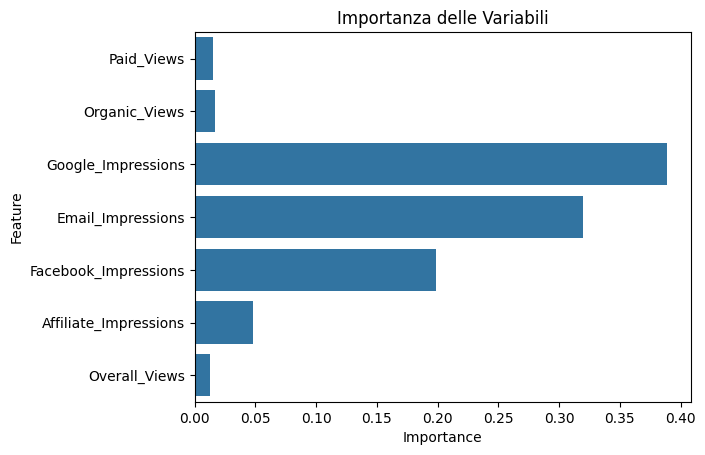

In [73]:
from sklearn.ensemble import RandomForestRegressor
#'Paid_Views', 'Organic_Views', 'Google_Impressions', 'Email_Impressions', 'Facebook_Impressions', 'Affiliate_Impressions', 'Overall_Views'
X = df[df.columns[2:9]].dropna()
y = df['Sales'].dropna()

model = RandomForestRegressor()
model.fit(X, y)

feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': model.feature_importances_})
sns.barplot(x='Importance', y='Feature', data=feature_importance)
plt.title('Importanza delle Variabili')
plt.show()
